In [ ]:
pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 8.3 MB/s 
     |████████████████████████████████| 16.7 MB 904 kB/s 
     |████████████████████████████████| 6.3 MB 22.7 MB/s 


In [ ]:
from datetime import datetime, timedelta
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import plotly.graph_objs as go
import plotly.offline as py
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
from collections import Counter
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import geopandas as gpd

In [ ]:
url = 'https://data.cityofnewyork.us/api/views/h9gi-nx95/rows.csv?accessType=DOWNLOAD' 
df = pd.read_csv(url, na_values=['','                                '])

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning:

Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.



In [ ]:
df.head()

,CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,...,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,COLLISION_ID,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5
0,09/11/2021,2:39,NaN,NaN,NaN,NaN,NaN,WHITESTONE EXPRESSWAY,20 AVENUE,NaN,...,Unspecified,NaN,NaN,NaN,4455765,Sedan,Sedan,NaN,NaN,NaN
1,03/26/2022,11:45,NaN,NaN,NaN,NaN,NaN,QUEENSBORO BRIDGE UPPER,NaN,NaN,...,NaN,NaN,NaN,NaN,4513547,Sedan,NaN,NaN,NaN,NaN
2,06/29/2022,6:55,NaN,NaN,NaN,NaN,NaN,THROGS NECK BRIDGE,NaN,NaN,...,Unspecified,NaN,NaN,NaN,4541903,Sedan,Pick-up Truck,NaN,NaN,NaN
3,09/11/2021,9:35,BROOKLYN,11208.0,40.667202,-73.866500,"(40.667202, -73.8665)",NaN,NaN,1211 LORING AVENUE,...,NaN,NaN,NaN,NaN,4456314,Sedan,NaN,NaN,NaN,NaN
4,12/14/2021,8:13,BROOKLYN,11233.0,40.683304,-73.917274,"(40.683304, -73.917274)",SARATOGA AVENUE,DECATUR STREET,NaN,...,NaN,NaN,NaN,NaN,4486609,NaN,NaN,NaN,NaN,NaN


In [ ]:
print('\033[1m' + "Size of the actual data:" + '\033[0m', df.shape)
print("\n")
print('\033[1m' + "Column Names and Data Types:" + '\033[0m')
print("\n")
print(df.dtypes)

Size of the actual data: (1945844, 29)


Column Names and Data Types:


CRASH DATE                        object
CRASH TIME                        object
BOROUGH                           object
ZIP CODE                          object
LATITUDE                         float64
LONGITUDE                        float64
LOCATION                          object
ON STREET NAME                    object
CROSS STREET NAME                 object
OFF STREET NAME                   object
NUMBER OF PERSONS INJURED        float64
NUMBER OF PERSONS KILLED         float64
NUMBER OF PEDESTRIANS INJURED      int64
NUMBER OF PEDESTRIANS KILLED       int64
NUMBER OF CYCLIST INJURED          int64
NUMBER OF CYCLIST KILLED           int64
NUMBER OF MOTORIST INJURED         int64
NUMBER OF MOTORIST KILLED          int64
CONTRIBUTING FACTOR VEHICLE 1     object
CONTRIBUTING FACTOR VEHICLE 2     object
CONTRIBUTING FACTOR VEHICLE 3     object
CONTRIBUTING FACTOR VEHICLE 4     object
CONTRIBUTING FACTOR VEHICL

In [ ]:
print('\033[1m' + "Descriptive Statistics:" + '\033[0m')
df.describe().round(2)

Descriptive Statistics:


,LATITUDE,LONGITUDE,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,COLLISION_ID
count,1721702.00,1721702.00,1945826.00,1945813.00,1945844.00,1945844.00,1945844.00,1945844.00,1945844.00,1945844.00,1945844.00
mean,40.64,-73.77,0.29,0.00,0.05,0.00,0.03,0.00,0.21,0.00,3060562.45
std,1.90,3.60,0.69,0.04,0.24,0.03,0.16,0.01,0.65,0.03,1503021.07
min,0.00,-201.36,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.00
25%,40.67,-73.98,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3108401.75
50%,40.72,-73.93,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3609123.50
75%,40.77,-73.87,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4095842.25
max,43.34,0.00,43.00,8.00,27.00,6.00,4.00,2.00,43.00,5.00,4582659.00


In [ ]:
df.isna().sum()

CRASH DATE                             0
CRASH TIME                             0
BOROUGH                           604082
ZIP CODE                          604316
LATITUDE                          224142
LONGITUDE                         224142
LOCATION                          224142
ON STREET NAME                    404949
CROSS STREET NAME                 717751
OFF STREET NAME                  1633281
NUMBER OF PERSONS INJURED             18
NUMBER OF PERSONS KILLED              31
NUMBER OF PEDESTRIANS INJURED          0
NUMBER OF PEDESTRIANS KILLED           0
NUMBER OF CYCLIST INJURED              0
NUMBER OF CYCLIST KILLED               0
NUMBER OF MOTORIST INJURED             0
NUMBER OF MOTORIST KILLED              0
CONTRIBUTING FACTOR VEHICLE 1       5894
CONTRIBUTING FACTOR VEHICLE 2     291034
CONTRIBUTING FACTOR VEHICLE 3    1809511
CONTRIBUTING FACTOR VEHICLE 4    1915545
CONTRIBUTING FACTOR VEHICLE 5    1937726
COLLISION_ID                           0
VEHICLE TYPE COD

Plotting the missing values


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



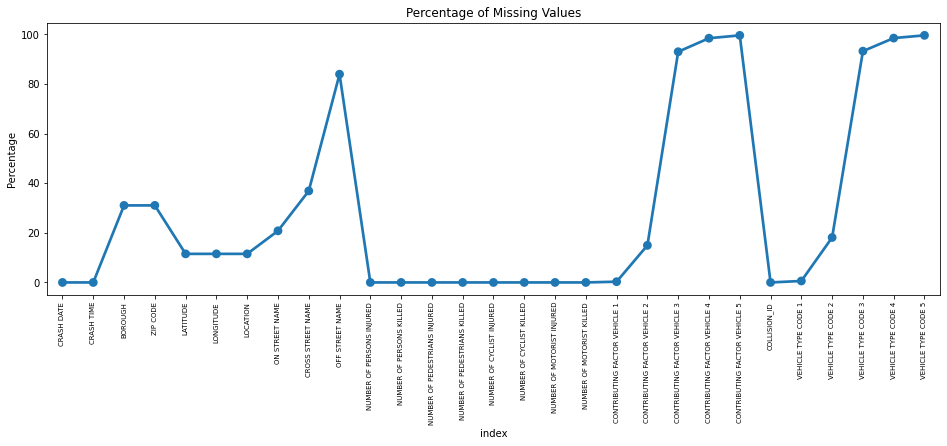

In [ ]:
print('\033[1m' + "Plotting the missing values" + '\033[0m')
missing_values = pd.DataFrame((df.isnull().sum())*100/df.shape[0]).reset_index()
plt.figure(figsize=(16,5))
ax = sns.pointplot('index',0,data=missing_values)
plt.xticks(rotation=90, fontsize=7)
plt.title("Percentage of Missing Values")
plt.ylabel("Percentage")
plt.show()

In [ ]:
pip install missingno


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


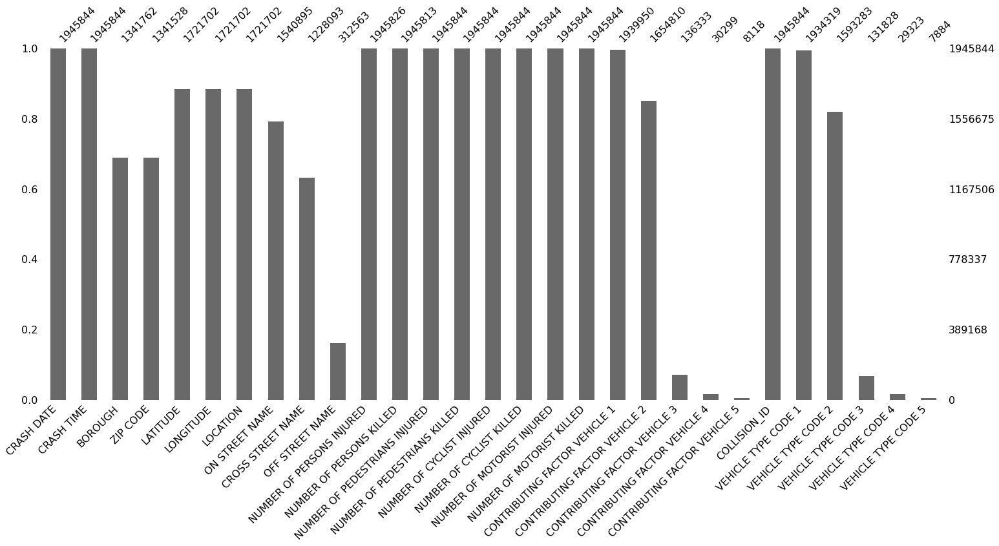

In [ ]:
import missingno as msno

msno.bar(df)

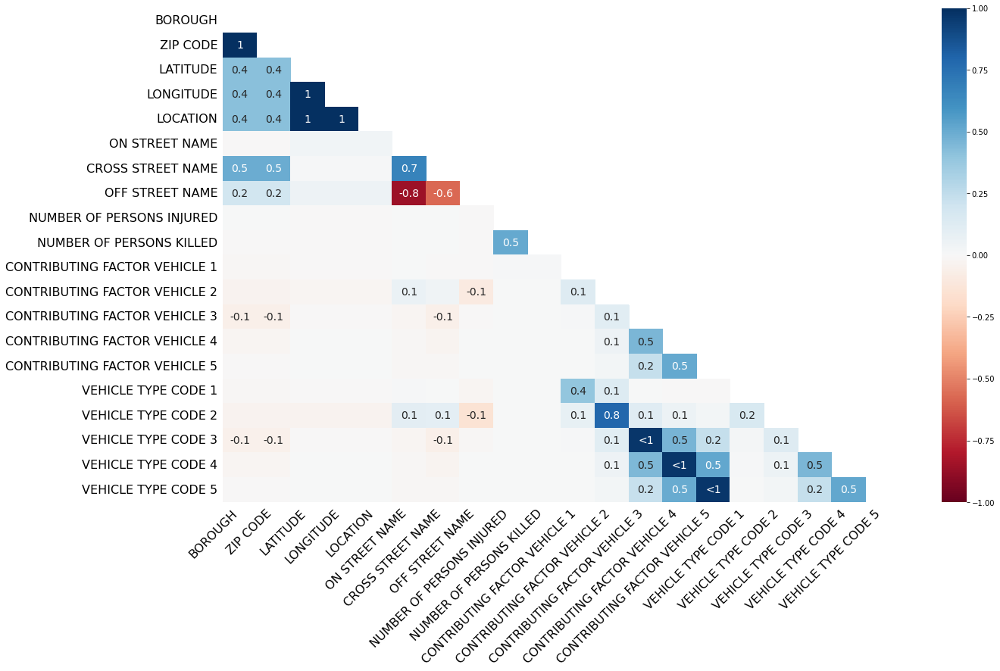

In [ ]:
msno.heatmap(df)

In [ ]:
#Add description of each col and the reason for deleting the columns
useful_cols=['CRASH DATE', 'CRASH TIME', 'BOROUGH', 'ZIP CODE', 'LATITUDE',
       'LONGITUDE', 'LOCATION','ON STREET NAME','CROSS STREET NAME', 'NUMBER OF PERSONS INJURED',
       'NUMBER OF PERSONS KILLED', 'NUMBER OF PEDESTRIANS INJURED',
       'NUMBER OF PEDESTRIANS KILLED', 'NUMBER OF CYCLIST INJURED',
       'NUMBER OF CYCLIST KILLED', 'NUMBER OF MOTORIST INJURED',
       'NUMBER OF MOTORIST KILLED', 'CONTRIBUTING FACTOR VEHICLE 1',
       'COLLISION_ID', 'VEHICLE TYPE CODE 1']
df_c=df[useful_cols]


drop_null_cols=['CRASH DATE', 'CRASH TIME', 'BOROUGH', 'ZIP CODE', 'LATITUDE',
       'LONGITUDE','CONTRIBUTING FACTOR VEHICLE 1','NUMBER OF PERSONS INJURED',
       'NUMBER OF PERSONS KILLED','VEHICLE TYPE CODE 1']
df_c_1=df_c.dropna(subset=drop_null_cols).reset_index(drop=True)
print("Rows with non-null values in important columns:",df_c_1.shape[0])

Rows with non-null values in important columns: 1296099


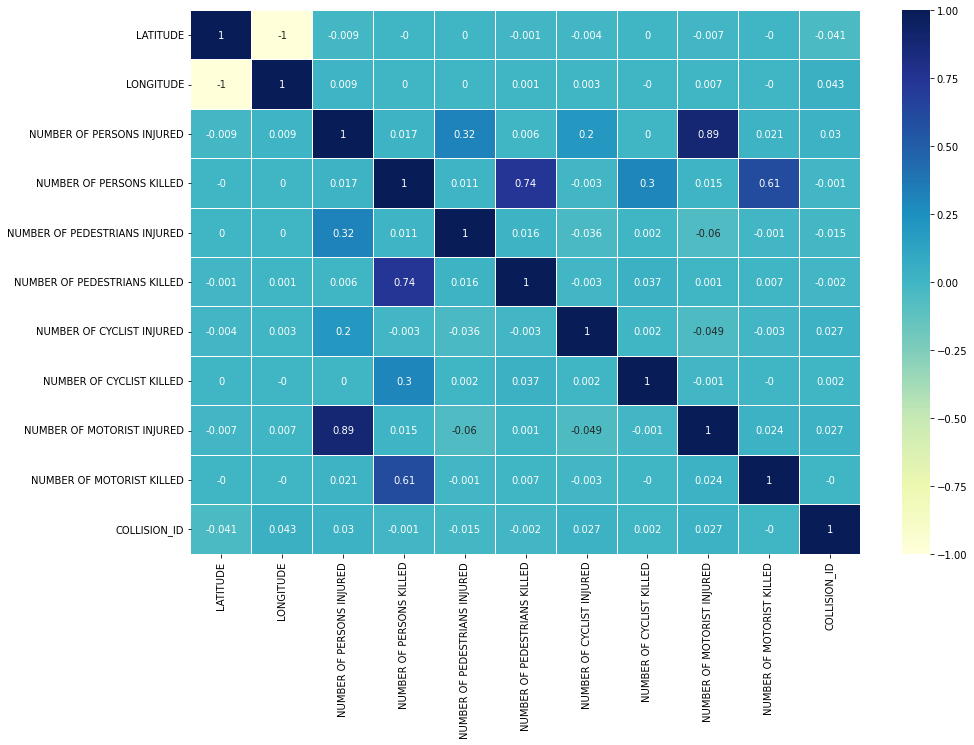

In [ ]:
plt.subplots(figsize=(15,10))
sns.heatmap(df_c_1.corr().round(3),linewidths=.01,annot=True,vmin=-1,vmax=1,cmap="YlGnBu")

In [ ]:
#rounding_type : 0 - No rounding (default)
#rounding_type : 1 - floor to nearest hour 
#rounding_type : 2 - round to nearest hour
def convert_string_datetime(datetime_string,datetime_format,rounding_type): #Covnerting datetime string to rounded datetime to nearest hour
    datetime_string=datetime_string.strip()
    datetime_f = datetime.strptime(datetime_string,datetime_format)
    if(rounding_type == 1):
        #Flooring to nearest hour
        datetime_f = datetime_f.replace(second = 0, microsecond = 0, minute = 0, hour = datetime_f.hour) 
    elif (rounding_type==2):
        #Rounding to nearest hour
        datetime_f = datetime_f.replace(second = 0, microsecond = 0, minute = 0, hour = datetime_f.hour) + timedelta(hours = datetime_f.minute // 31)
    return datetime_f

#Taking date and time cols to convert compose datetime string and thereafter returning normalized datetime string
def normalized_datetime(row_var,date_col,time_col,datetime_format,rounding_type=0): 
    datetime_string = str(row_var[date_col]) + " " + str(row_var[time_col])
    datetime_f = convert_string_datetime(datetime_string, datetime_format,rounding_type) #Function to convert datetime string to rounded datetime
    return datetime_f

In [ ]:
collision_date_col = 'CRASH DATE'
collision_time_col = 'CRASH TIME'
collision_dt_format="%m/%d/%Y %H:%M"
df_c_1['Collision_Datetime']=df_c_1.apply(lambda x:normalized_datetime(x,collision_date_col,collision_time_col,collision_dt_format,1),axis=1)
df_c_1

,CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,NUMBER OF PERSONS INJURED,...,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,CONTRIBUTING FACTOR VEHICLE 1,COLLISION_ID,VEHICLE TYPE CODE 1,Collision_Datetime
0,09/11/2021,9:35,BROOKLYN,11208.0,40.667202,-73.866500,"(40.667202, -73.8665)",NaN,NaN,0.0,...,0,0,0,0,0,0,Unspecified,4456314,Sedan,2021-09-11 09:00:00
1,12/14/2021,8:17,BRONX,10475.0,40.868160,-73.831480,"(40.86816, -73.83148)",NaN,NaN,2.0,...,0,0,0,0,2,0,Unspecified,4486660,Sedan,2021-12-14 08:00:00
2,12/14/2021,21:10,BROOKLYN,11207.0,40.671720,-73.897100,"(40.67172, -73.8971)",NaN,NaN,0.0,...,0,0,0,0,0,0,Driver Inexperience,4487074,Sedan,2021-12-14 21:00:00
3,12/14/2021,14:58,MANHATTAN,10017.0,40.751440,-73.973970,"(40.75144, -73.97397)",3 AVENUE,EAST 43 STREET,0.0,...,0,0,0,0,0,0,Passing Too Closely,4486519,Sedan,2021-12-14 14:00:00
4,12/14/2021,16:50,QUEENS,11413.0,40.675884,-73.755770,"(40.675884, -73.75577)",SPRINGFIELD BOULEVARD,EAST GATE PLAZA,0.0,...,0,0,0,0,0,0,Turning Improperly,4487127,Sedan,2021-12-14 16:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1296094,11/02/2022,21:09,BROOKLYN,11215.0,40.663265,-73.991450,"(40.663265, -73.99145)",NaN,NaN,1.0,...,0,0,1,0,0,0,Unspecified,4582541,E-Bike,2022-11-02 21:00:00
1296095,11/15/2022,15:20,MANHATTAN,10017.0,0.000000,0.000000,"(0.0, 0.0)",NaN,NaN,0.0,...,0,0,0,0,0,0,Unsafe Lane Changing,4582488,Taxi,2022-11-15 15:00:00
1296096,11/15/2022,20:47,QUEENS,11416.0,40.682800,-73.853065,"(40.6828, -73.853065)",87 STREET,ROCKAWAY BOULEVARD,1.0,...,1,0,0,0,0,0,Failure to Yield Right-of-Way,4582224,Station Wagon/Sport Utility Vehicle,2022-11-15 20:00:00
1296097,11/14/2022,19:45,BRONX,10475.0,40.869587,-73.827090,"(40.869587, -73.82709)",NaN,NaN,0.0,...,0,0,0,0,0,0,Passing or Lane Usage Improper,4582469,Pick-up Truck,2022-11-14 19:00:00


In [ ]:
def time_of_day(datetime_obj):
    hour24 = datetime_obj.hour
    part_of_day = ""
    if 5 <= hour24 < 12:
        part_of_day = "Morning"
    elif 12 <= hour24 < 17:
        part_of_day = "Afternoon"
    elif 17<= hour24 < 21:
        part_of_day="Evening"
    elif 21 <= hour24 < 24 or 0 <= hour24 <5:
        part_of_day = "Night"

    return part_of_day

In [ ]:
df_c_1['Part_of_day'] = df_c_1['Collision_Datetime'].apply(time_of_day)
df_c_1.head()

,CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,NUMBER OF PERSONS INJURED,...,NUMBER OF PEDESTRIANS KILLED,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,CONTRIBUTING FACTOR VEHICLE 1,COLLISION_ID,VEHICLE TYPE CODE 1,Collision_Datetime,Part_of_day
0,09/11/2021,9:35,BROOKLYN,11208.0,40.667202,-73.86650,"(40.667202, -73.8665)",NaN,NaN,0.0,...,0,0,0,0,0,Unspecified,4456314,Sedan,2021-09-11 09:00:00,Morning
1,12/14/2021,8:17,BRONX,10475.0,40.868160,-73.83148,"(40.86816, -73.83148)",NaN,NaN,2.0,...,0,0,0,2,0,Unspecified,4486660,Sedan,2021-12-14 08:00:00,Morning
2,12/14/2021,21:10,BROOKLYN,11207.0,40.671720,-73.89710,"(40.67172, -73.8971)",NaN,NaN,0.0,...,0,0,0,0,0,Driver Inexperience,4487074,Sedan,2021-12-14 21:00:00,Night
3,12/14/2021,14:58,MANHATTAN,10017.0,40.751440,-73.97397,"(40.75144, -73.97397)",3 AVENUE,EAST 43 STREET,0.0,...,0,0,0,0,0,Passing Too Closely,4486519,Sedan,2021-12-14 14:00:00,Afternoon
4,12/14/2021,16:50,QUEENS,11413.0,40.675884,-73.75577,"(40.675884, -73.75577)",SPRINGFIELD BOULEVARD,EAST GATE PLAZA,0.0,...,0,0,0,0,0,Turning Improperly,4487127,Sedan,2021-12-14 16:00:00,Afternoon


In [ ]:
sample_df= df_c_1
sample_df = sample_df.groupby(['CONTRIBUTING FACTOR VEHICLE 1'])\
['NUMBER OF PERSONS INJURED', 'NUMBER OF PERSONS KILLED'].agg('sum').reset_index()
sample_df_killed = sample_df.sort_values('NUMBER OF PERSONS KILLED', ascending = False).head(11)
sample_df_killed = sample_df_killed[1:11]
sample_df_injured = sample_df.sort_values('NUMBER OF PERSONS INJURED', ascending = False).head(11)
sample_df_injured = sample_df_injured[1:11]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



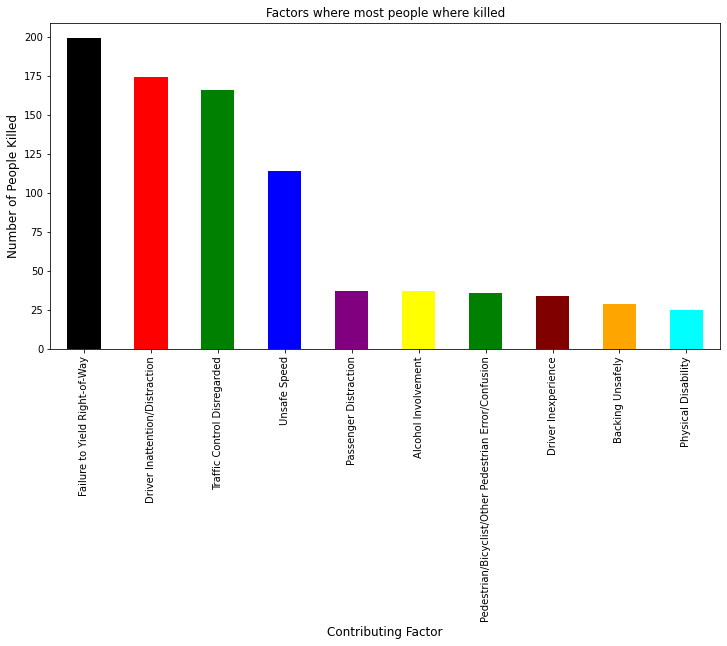

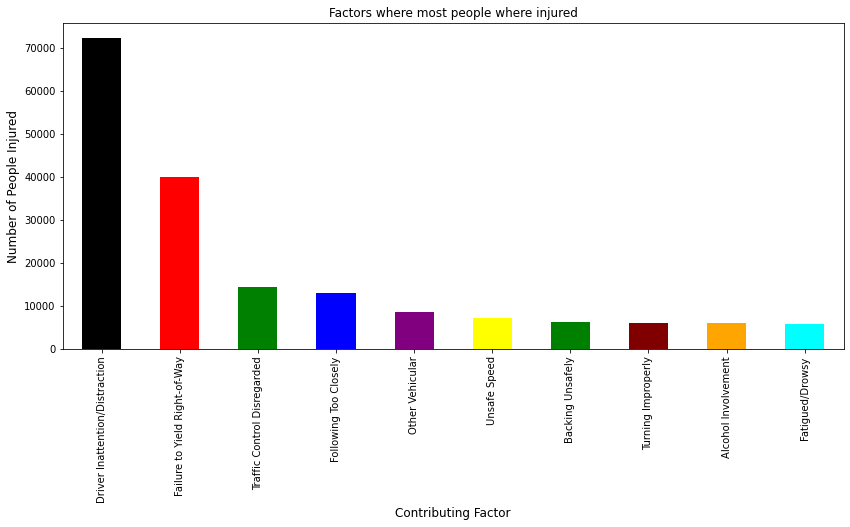

In [ ]:
fig, ax = plt.subplots(1, figsize=(12, 6))
fig, ax1 = plt.subplots(1, figsize=(14, 6))



sample_df_killed.plot(x = 'CONTRIBUTING FACTOR VEHICLE 1', 
                      y = 'NUMBER OF PERSONS KILLED', kind = 'bar', 
                      stacked = True, ax = ax, color=['black', 'red', 'green', 'blue', 'purple', 'yellow', 'green', 'maroon', 'orange', 'cyan'])


ax.set_title('Factors where most people where killed', size = 12)
ax.set_xlabel('Contributing Factor', size = 12)
ax.set_ylabel('Number of People Killed', size = 12)
ax.get_legend().remove() #As we have used various colors here we removed the legend 


sample_df_injured.plot(x = 'CONTRIBUTING FACTOR VEHICLE 1', 
                      y = 'NUMBER OF PERSONS INJURED', kind = 'bar', color=['black', 'red', 'green', 'blue', 'purple', 'yellow', 'green', 'maroon', 'orange', 'cyan'],
                      stacked = True, ax = ax1)


ax1.set_title('Factors where most people where injured', size = 12)
ax1.set_xlabel('Contributing Factor', size = 12)
ax1.set_ylabel('Number of People Injured', size = 12)
ax1.get_legend().remove()

Text(0.5, 0, 'Frequency')

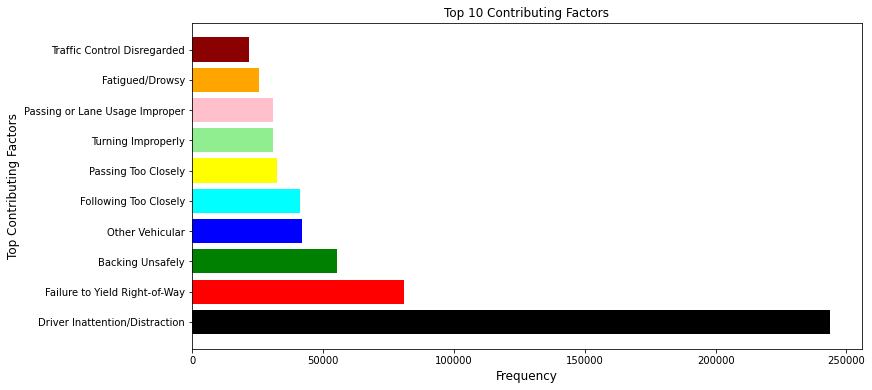

In [ ]:
fig, ax = plt.subplots(1, figsize=(12, 6))
temp_dict=df_c_1['CONTRIBUTING FACTOR VEHICLE 1'].value_counts().to_dict()
out = dict(list(temp_dict.items())[1: 11])
names = list(out.keys())
values = list(out.values())
plt.barh(range(len(out)), values, tick_label=names,color=['black', 'red', 'green', 'blue', 'cyan', 'yellow', 'lightgreen', 'pink', 'orange', 'darkred'] )

ax.set_title('Top 10 Contributing Factors', size = 12)
ax.set_ylabel('Top Contributing Factors', size = 12)
ax.set_xlabel('Frequency', size = 12)

In [ ]:
borough_stats = df_c_1.groupby(['BOROUGH'])\
['NUMBER OF PERSONS KILLED', 'NUMBER OF PERSONS INJURED'].agg('sum').reset_index()
borough_stats['Total Accidents'] = df.groupby(['BOROUGH']).size().reset_index(name='NoOfAccidents').NoOfAccidents
borough_stats

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,BOROUGH,NUMBER OF PERSONS KILLED,NUMBER OF PERSONS INJURED,Total Accidents
0,BRONX,222.0,57954.0,197189
1,BROOKLYN,514.0,128744.0,424132
2,MANHATTAN,274.0,57243.0,304740
3,QUEENS,448.0,98704.0,359363
4,STATEN ISLAND,83.0,14796.0,56338


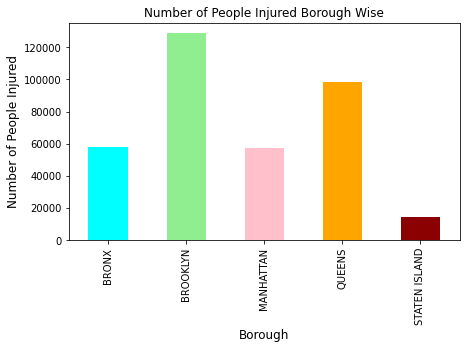

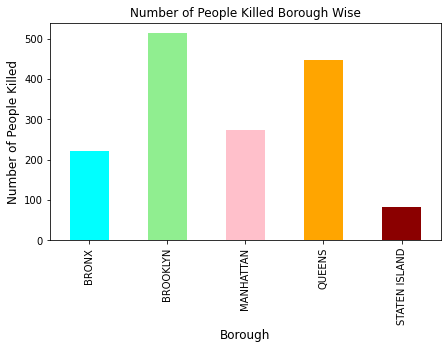

In [ ]:
fig, ax = plt.subplots(1, figsize=(7, 4))
fig, ax1 = plt.subplots(1, figsize=(7, 4))

borough_stats.plot(x = 'BOROUGH', 
                      y = 'NUMBER OF PERSONS INJURED', kind = 'bar', color=[ 'cyan', 'lightgreen', 'pink', 'orange', 'darkred'],ax = ax ,  stacked = True)

ax.set_title('Number of People Injured Borough Wise', size = 12)
ax.set_xlabel('Borough', size = 12)
ax.set_ylabel('Number of People Injured', size = 12)
ax.get_legend().remove()



borough_stats.plot(x = 'BOROUGH', 
                      y = 'NUMBER OF PERSONS KILLED', kind = 'bar', color=[ 'cyan', 'lightgreen', 'pink', 'orange', 'darkred'],
                      stacked = True, ax = ax1)

ax1.set_title('Number of People Killed Borough Wise', size = 12)
ax1.set_xlabel('Borough', size = 12)
ax1.set_ylabel('Number of People Killed', size = 12)
ax1.get_legend().remove()

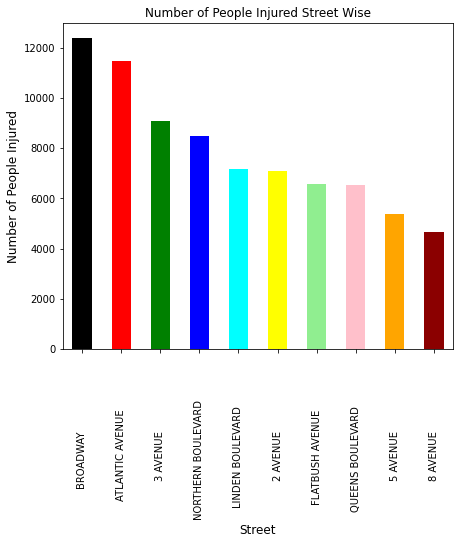

In [ ]:
street_count = df_c_1.groupby(['ON STREET NAME'])['ON STREET NAME'].count().reset_index(name='Collisions')
street_count = street_count.sort_values('Collisions', ascending = False).head(10)
fig, ax = plt.subplots(1, figsize=(7, 6))
street_count.plot(x = 'ON STREET NAME', 
                      y = 'Collisions', kind = 'bar', color=['black', 'red', 'green', 'blue', 'cyan', 'yellow', 'lightgreen', 'pink', 'orange', 'darkred'],ax = ax ,  stacked = True)

ax.set_title('Number of People Injured Street Wise', size = 12)
ax.set_xlabel('Street', size = 12)
ax.set_ylabel('Number of People Injured', size = 12)
ax.get_legend().remove()
plt.show()

In [ ]:
df_injured = df[[i for i in df.columns for c in ['NUMBER OF PEDESTRIANS INJURED', 'NUMBER OF CYCLIST INJURED', 'NUMBER OF MOTORIST INJURED'] if c in i]].sum()
df_killed = df[[i for i in df.columns for c in ['NUMBER OF PEDESTRIANS KILLED', 'NUMBER OF CYCLIST KILLED', 'NUMBER OF MOTORIST KILLED'] if c in i]].sum()

In [ ]:
df_injured

NUMBER OF PEDESTRIANS INJURED    104616
NUMBER OF CYCLIST INJURED         49213
NUMBER OF MOTORIST INJURED       412681
dtype: int64

In [ ]:
df_killed

NUMBER OF PEDESTRIANS KILLED    1378
NUMBER OF CYCLIST KILLED         200
NUMBER OF MOTORIST KILLED       1101
dtype: int64

In [ ]:
df_injured.index = ['Pedestrian', 'Cyclist', 'Motorist']

In [ ]:
df_killed.index = ['Pedestrian', 'Cyclist', 'Motorist']

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



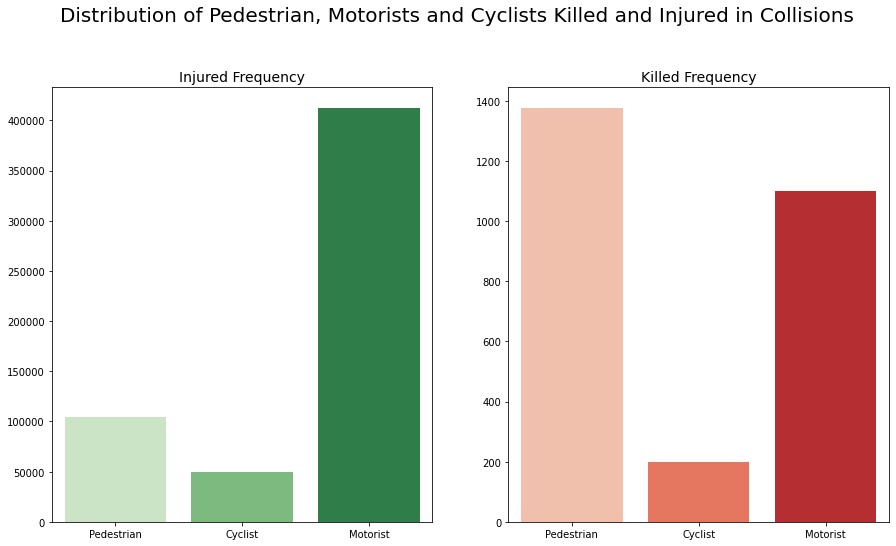

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(15,8))
plt.suptitle('Distribution of Pedestrian, Motorists and Cyclists Killed and Injured in Collisions', fontsize=20, x=0.5,y=1.02)
ax[0].set_title('Injured Frequency', fontsize=14)
ax[1].set_title('Killed Frequency', fontsize=14)

sns.barplot(df_injured.index, df_injured.values, ax=ax[0], palette='Greens')
sns.barplot(df_killed.index, df_killed.values, ax=ax[1], palette='Reds')

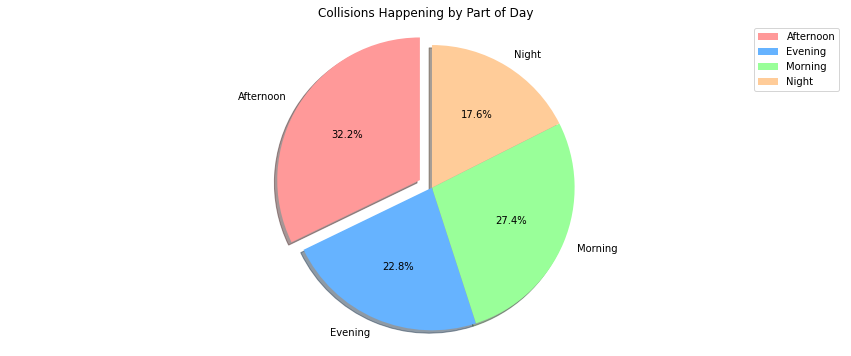

In [ ]:
part_day_df = df_c_1.groupby(['Part_of_day'])['Part_of_day'].count().reset_index(name='Collisions')
fig, ax = plt.subplots(figsize=(15,6))
explode = (0.1, 0, 0, 0)  
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99']

ax.pie(part_day_df.Collisions,
       labels=part_day_df.Part_of_day,
       autopct='%1.1f%%',
       explode = explode,
       colors = colors, 
       shadow=True,
       startangle=90)
ax.axis('equal')  
ax.legend(part_day_df.Part_of_day)
ax.set_title('Collisions Happening by Part of Day')


plt.show()

In [ ]:
borough_part_day_df = df_c_1.groupby(['Part_of_day', 'BOROUGH'])['BOROUGH'].count().reset_index(name='Collisions')
brooklyn_df = borough_part_day_df[borough_part_day_df['BOROUGH'] == 'BROOKLYN'] 
manhattan_df = borough_part_day_df[borough_part_day_df['BOROUGH'] == 'MANHATTAN'] 
queens_df =  borough_part_day_df[borough_part_day_df['BOROUGH'] == 'QUEENS'] 
bronx_df =  borough_part_day_df[borough_part_day_df['BOROUGH'] == 'BRONX'] 
staten_island_df =  borough_part_day_df[borough_part_day_df['BOROUGH'] == 'STATEN ISLAND']

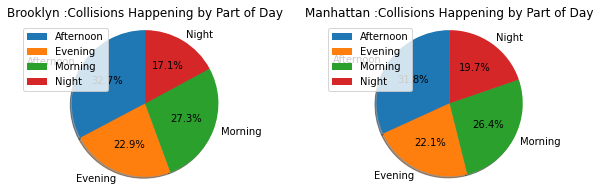

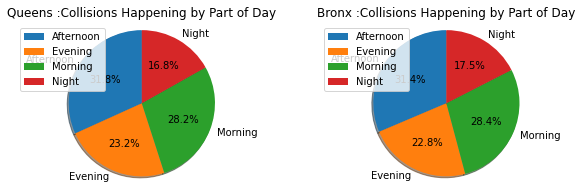

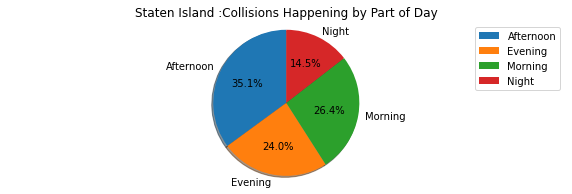

In [ ]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(10,3)) #ax1,ax2 refer to your two pies
fig, (ax3,ax4) = plt.subplots(1,2, figsize=(10,3)) #ax1,ax2 refer to your two pies
fig, ax5 = plt.subplots(1, figsize=(10,3)) 

# 1,2 denotes 1 row, 2 columns - if you want to stack vertically, it would be 2,1
ax1.pie(brooklyn_df.Collisions,
       labels=brooklyn_df.Part_of_day,
       autopct='%1.1f%%',
       shadow=True,
       startangle=90)
ax1.axis('equal')  
ax1.set_title('Brooklyn :Collisions Happening by Part of Day')
ax1.legend(part_day_df.Part_of_day)



ax2.pie(manhattan_df.Collisions,
       labels=manhattan_df.Part_of_day,
       autopct='%1.1f%%',
       shadow=True,
       startangle=90)
ax2.axis('equal')  
ax2.set_title('Manhattan :Collisions Happening by Part of Day')
ax2.legend(part_day_df.Part_of_day)

ax3.pie(queens_df.Collisions,
       labels=queens_df.Part_of_day,
       autopct='%1.1f%%',
       shadow=True,
       startangle=90)
ax3.axis('equal')  
ax3.set_title('Queens :Collisions Happening by Part of Day')
ax3.legend(part_day_df.Part_of_day)




ax4.pie(bronx_df.Collisions,
       labels=bronx_df.Part_of_day,
       autopct='%1.1f%%',
       shadow=True,
       startangle=90)
ax4.axis('equal')  
ax4.set_title('Bronx :Collisions Happening by Part of Day')
ax4.legend(part_day_df.Part_of_day)



ax5.pie(staten_island_df.Collisions,
       labels=staten_island_df.Part_of_day,
       autopct='%1.1f%%',
       shadow=True,
       startangle=90)
ax5.axis('equal')  
ax5.set_title('Staten Island :Collisions Happening by Part of Day')
ax5.legend(part_day_df.Part_of_day)

In [ ]:
c1= Counter(df_c_1['ON STREET NAME'])
c1.most_common()

[(nan, 270423),
 ('BROADWAY                        ', 12365),
 ('ATLANTIC AVENUE                 ', 11457),
 ('3 AVENUE                        ', 9076),
 ('NORTHERN BOULEVARD              ', 8461),
 ('LINDEN BOULEVARD                ', 7155),
 ('2 AVENUE                        ', 7069),
 ('FLATBUSH AVENUE                 ', 6555),
 ('QUEENS BOULEVARD                ', 6546),
 ('5 AVENUE                        ', 5389),
 ('8 AVENUE                        ', 4651),
 ('HYLAN BOULEVARD                 ', 4511),
 ('10 AVENUE                       ', 4495),
 ('7 AVENUE                        ', 4434),
 ('1 AVENUE                        ', 4427),
 ('JAMAICA AVENUE                  ', 4382),
 ('WOODHAVEN BOULEVARD             ', 4297),
 ('NOSTRAND AVENUE                 ', 4151),
 ('BRUCKNER BOULEVARD              ', 4140),
 ('HILLSIDE AVENUE                 ', 4050),
 ('BEDFORD AVENUE                  ', 4050),
 ('EASTERN PARKWAY                 ', 4029),
 ('NORTH CONDUIT AVENUE            ',

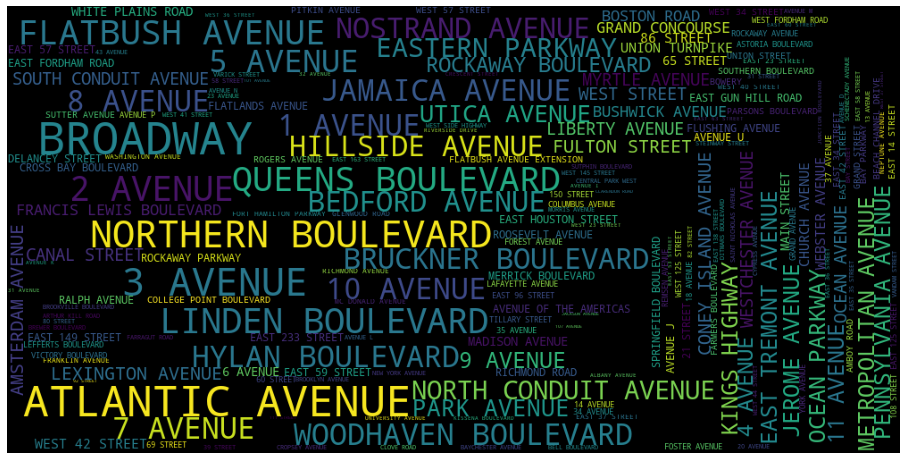

In [ ]:
on_street_name= df_c_1['ON STREET NAME'].dropna()
c1= Counter(on_street_name)
wordcloud = WordCloud(background_color= 'BLACK', width = 1000, height = 500).generate_from_frequencies(c1)
plt.figure(figsize=(16,16))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()
plt.close()

In [ ]:
import calendar
date_time_df= df_c_1
#Extract DateTime features
date_time_df['collisions_datetime'] = pd.to_datetime(df_c_1['CRASH DATE'], infer_datetime_format = True)   #infer_datetime_format=True) 
date_time_df['collisions_time'] = pd.to_datetime(df_c_1['CRASH TIME'], infer_datetime_format = True) 


date_time_df.loc[:, 'collisions_weekday'] = date_time_df['collisions_datetime'].dt.weekday
date_time_df.loc[:, 'collisions_weekofyear'] = date_time_df['collisions_datetime'].dt.weekofyear
date_time_df.loc[:, 'collisions_hour'] = date_time_df['collisions_time'].dt.hour
date_time_df.loc[:, 'collisions_minute'] = date_time_df['collisions_time'].dt.minute
#date_time_df.head()

date_time_df['weekday_name']=date_time_df['collisions_weekday'].apply(lambda x: calendar.day_name[x])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



In [ ]:
date_time_df.head()

,CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,NUMBER OF PERSONS INJURED,...,VEHICLE TYPE CODE 1,Collision_Datetime,Part_of_day,collisions_datetime,collisions_time,collisions_weekday,collisions_weekofyear,collisions_hour,collisions_minute,weekday_name
0,09/11/2021,9:35,BROOKLYN,11208.0,40.667202,-73.86650,"(40.667202, -73.8665)",NaN,NaN,0.0,...,Sedan,2021-09-11 09:00:00,Morning,2021-09-11,2022-11-21 09:35:00,5,36,9,35,Saturday
1,12/14/2021,8:17,BRONX,10475.0,40.868160,-73.83148,"(40.86816, -73.83148)",NaN,NaN,2.0,...,Sedan,2021-12-14 08:00:00,Morning,2021-12-14,2022-11-21 08:17:00,1,50,8,17,Tuesday
2,12/14/2021,21:10,BROOKLYN,11207.0,40.671720,-73.89710,"(40.67172, -73.8971)",NaN,NaN,0.0,...,Sedan,2021-12-14 21:00:00,Night,2021-12-14,2022-11-21 21:10:00,1,50,21,10,Tuesday
3,12/14/2021,14:58,MANHATTAN,10017.0,40.751440,-73.97397,"(40.75144, -73.97397)",3 AVENUE,EAST 43 STREET,0.0,...,Sedan,2021-12-14 14:00:00,Afternoon,2021-12-14,2022-11-21 14:58:00,1,50,14,58,Tuesday
4,12/14/2021,16:50,QUEENS,11413.0,40.675884,-73.75577,"(40.675884, -73.75577)",SPRINGFIELD BOULEVARD,EAST GATE PLAZA,0.0,...,Sedan,2021-12-14 16:00:00,Afternoon,2021-12-14,2022-11-21 16:50:00,1,50,16,50,Tuesday


In [ ]:
days_list=list()
total_collisions=0
day_dict={0:"Monday",1:"Tuesday",2:"Wednesday",3:"Thursday",4:"Friday",5:"Saturday",6:"Sunday"}
for i in range(0,7):
    day_filt = date_time_df[date_time_df['collisions_weekday'] == i]
    df_day_hour_groupby = day_filt.groupby('collisions_hour').count()
    day_crash_time = list(df_day_hour_groupby['CRASH TIME'])
    total_collisions+=sum(day_crash_time)
    collisions_hour_wise = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]
    each_day = go.Scatter(x = collisions_hour_wise, y = day_crash_time,  mode = "lines+markers", name = day_dict[i])
    days_list.append(each_day)

layout = dict(title = 'Weekly Analysis of Collisions per Hour', 
              xaxis= dict(title= 'Hour',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'Number of Collisions Happening',ticklen= 5,zeroline= False)
             )
fig = dict(data=days_list, layout=layout)

In [ ]:
py.iplot(fig, filename='timeline-lineplot')

In [ ]:
total_collisions=0
boroughs=list(date_time_df['BOROUGH'].dropna().unique())

day_dict={0:"Monday",1:"Tuesday",2:"Wednesday",3:"Thursday",4:"Friday",5:"Saturday",6:"Sunday"}

for borough in boroughs:

    days_list=list()
    print(borough)
    days_list=list()
    df_borough_filtered=date_time_df[date_time_df['BOROUGH'] == borough]
    for i in range(0,7):
        day_filt=df_borough_filtered[df_borough_filtered['weekday_name'] == day_dict[i]  ]


        df_day_hour_groupby = day_filt.groupby('collisions_hour').count()
        day_crash_time = list(df_day_hour_groupby['CRASH TIME'])
        total_collisions+=sum(day_crash_time)
        collisions_hour_wise = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]
        each_day = go.Scatter(x = collisions_hour_wise, y = day_crash_time,  mode = "lines+markers", name = day_dict[i])
        days_list.append(each_day)

    layout = dict(title = 'Borough Wise Analysis of Collisions per Hour', 
                xaxis= dict(title= 'Hour',ticklen= 5,zeroline= False),
                yaxis= dict(title= 'Number of Collisions Happening',ticklen= 5,zeroline= False)
              )
    fig = dict(data=days_list, layout=layout)
    py.iplot(fig, filename='timeline-lineplot')

BROOKLYN


BRONX


MANHATTAN


QUEENS


STATEN ISLAND


In [ ]:
!pip install folium

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
df_c_1.head()

,CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,NUMBER OF PERSONS INJURED,...,VEHICLE TYPE CODE 1,Collision_Datetime,Part_of_day,collisions_datetime,collisions_time,collisions_weekday,collisions_weekofyear,collisions_hour,collisions_minute,weekday_name
0,09/11/2021,9:35,BROOKLYN,11208.0,40.667202,-73.86650,"(40.667202, -73.8665)",NaN,NaN,0.0,...,Sedan,2021-09-11 09:00:00,Morning,2021-09-11,2022-11-21 09:35:00,5,36,9,35,Saturday
1,12/14/2021,8:17,BRONX,10475.0,40.868160,-73.83148,"(40.86816, -73.83148)",NaN,NaN,2.0,...,Sedan,2021-12-14 08:00:00,Morning,2021-12-14,2022-11-21 08:17:00,1,50,8,17,Tuesday
2,12/14/2021,21:10,BROOKLYN,11207.0,40.671720,-73.89710,"(40.67172, -73.8971)",NaN,NaN,0.0,...,Sedan,2021-12-14 21:00:00,Night,2021-12-14,2022-11-21 21:10:00,1,50,21,10,Tuesday
3,12/14/2021,14:58,MANHATTAN,10017.0,40.751440,-73.97397,"(40.75144, -73.97397)",3 AVENUE,EAST 43 STREET,0.0,...,Sedan,2021-12-14 14:00:00,Afternoon,2021-12-14,2022-11-21 14:58:00,1,50,14,58,Tuesday
4,12/14/2021,16:50,QUEENS,11413.0,40.675884,-73.75577,"(40.675884, -73.75577)",SPRINGFIELD BOULEVARD,EAST GATE PLAZA,0.0,...,Sedan,2021-12-14 16:00:00,Afternoon,2021-12-14,2022-11-21 16:50:00,1,50,16,50,Tuesday


In [ ]:
#Distribution of accidents in Brooklyn
#Distribution of accidents 
data = df_c_1.dropna(subset=['LATITUDE', 'LONGITUDE'])
borough_dict={}
marker_cluster_dict={}
for borough in data['BOROUGH'].dropna().unique():
    df1=data.loc[data['BOROUGH'] == borough]
    df1= df1.head(10000)
    borough_dict[borough]=folium.Map(location=[40.638177,-73.964160],tiles="stamenterrain",zoom_start=11)
    marker_cluster_dict[borough] = MarkerCluster().add_to(borough_dict[borough])

    locations = df1[['LATITUDE', 'LONGITUDE']]
    locationlist = locations.values.tolist()

    for point in range(0, len(locationlist)):
        folium.Marker(locationlist[point]).add_to(marker_cluster_dict[borough])

In [ ]:
print("Analysis of Collisions in Brooklyn Borough")
borough_dict['BROOKLYN']

Analysis of Collisions in Brooklyn Borough


In [ ]:
print("Analysis of Collisions in Queens Borough")
borough_dict['QUEENS']

Analysis of Collisions in Queens Borough


In [ ]:
print("Analysis of Collisions in Queens Borough")
borough_dict['STATEN ISLAND']

Analysis of Collisions in Queens Borough


In [ ]:
df_c_1.head()

,CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,NUMBER OF PERSONS INJURED,...,VEHICLE TYPE CODE 1,Collision_Datetime,Part_of_day,collisions_datetime,collisions_time,collisions_weekday,collisions_weekofyear,collisions_hour,collisions_minute,weekday_name
0,09/11/2021,9:35,BROOKLYN,11208.0,40.667202,-73.86650,"(40.667202, -73.8665)",NaN,NaN,0.0,...,Sedan,2021-09-11 09:00:00,Morning,2021-09-11,2022-11-21 09:35:00,5,36,9,35,Saturday
1,12/14/2021,8:17,BRONX,10475.0,40.868160,-73.83148,"(40.86816, -73.83148)",NaN,NaN,2.0,...,Sedan,2021-12-14 08:00:00,Morning,2021-12-14,2022-11-21 08:17:00,1,50,8,17,Tuesday
2,12/14/2021,21:10,BROOKLYN,11207.0,40.671720,-73.89710,"(40.67172, -73.8971)",NaN,NaN,0.0,...,Sedan,2021-12-14 21:00:00,Night,2021-12-14,2022-11-21 21:10:00,1,50,21,10,Tuesday
3,12/14/2021,14:58,MANHATTAN,10017.0,40.751440,-73.97397,"(40.75144, -73.97397)",3 AVENUE,EAST 43 STREET,0.0,...,Sedan,2021-12-14 14:00:00,Afternoon,2021-12-14,2022-11-21 14:58:00,1,50,14,58,Tuesday
4,12/14/2021,16:50,QUEENS,11413.0,40.675884,-73.75577,"(40.675884, -73.75577)",SPRINGFIELD BOULEVARD,EAST GATE PLAZA,0.0,...,Sedan,2021-12-14 16:00:00,Afternoon,2021-12-14,2022-11-21 16:50:00,1,50,16,50,Tuesday


In [ ]:
location = df_c_1['LOCATION'].value_counts()
location_counts = pd.DataFrame({"LOCATION" : location.index, "Count":location})
location_counts.index = range(len(location))

In [ ]:
location = df_c_1.groupby('LOCATION').first()
new_df_location = location.loc[:, ['LATITUDE', 'LONGITUDE', 'ZIP CODE', 'ON STREET NAME', 'BOROUGH']]
loc_groupby = pd.merge(location_counts,new_df_location,on='LOCATION')
loc_groupby.drop(loc_groupby.index[0], inplace=True)

In [ ]:
map = folium.Map(location=[40.721757, -73.930529],
                        zoom_start=13)

for i in range(500):
    lat = loc_groupby.iloc[i][2]
    long = loc_groupby.iloc[i][3]
    radius = loc_groupby['Count'].iloc[i] / 30
    
    if loc_groupby['Count'].iloc[i] > 300:
        color = "#8B0000"
    else:
        color = "#4169E1"
    
    popup_text = """Latitude : {}
                Longitude : {}
                Zip Code : {}
                Street : {}
                Borough : {}
                Collisions :{} """
    popup_text = popup_text.format(loc_groupby['LATITUDE'].iloc[i],
                               loc_groupby['LONGITUDE'].iloc[i],
                               loc_groupby['ZIP CODE'].iloc[i],
                               loc_groupby['ON STREET NAME'].iloc[i],
                               loc_groupby['BOROUGH'].iloc[i],
                               loc_groupby['Count'].iloc[i]
                               )
    folium.CircleMarker(location = [lat, long], popup= popup_text,radius = radius, color = color, fill = True).add_to(map)
print("Detailed Analysis and Comparison of High and Low Collision Spots with Necessary Information")
map

Detailed Analysis and Comparison of High and Low Collision Spots with Necessary Information


In [ ]:
df_c_2 = df_c_1.dropna(subset=['ON STREET NAME', 'CROSS STREET NAME'])

Plotting the missing values


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



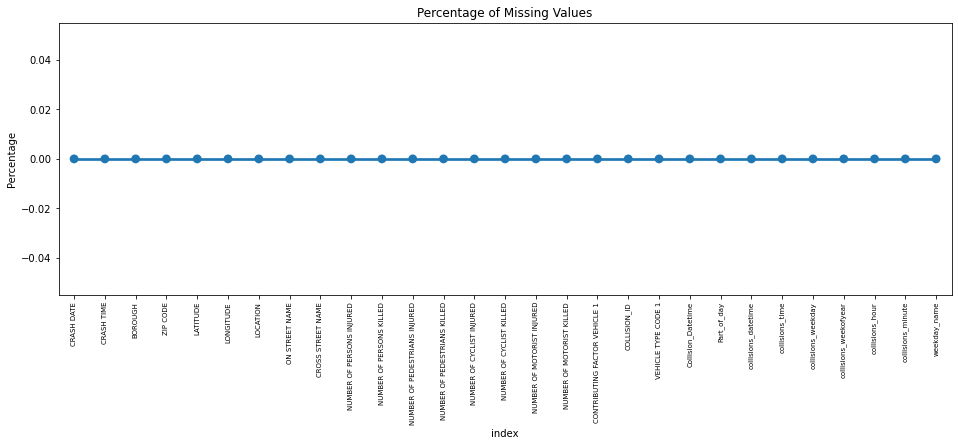

In [ ]:
print('\033[1m' + "Plotting the missing values" + '\033[0m')
missing_values = pd.DataFrame((df_c_2.isnull().sum())*100/df_c_2.shape[0]).reset_index()
plt.figure(figsize=(16,5))
ax = sns.pointplot('index',0,data=missing_values)
plt.xticks(rotation=90, fontsize=7)
plt.title("Percentage of Missing Values")
plt.ylabel("Percentage")
plt.show()